In [1]:
import os
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
!pip3 install pyclustering prettytable

# Imports

In [3]:
from prettytable import PrettyTable
from pyclustering.cluster.xmeans import xmeans
from pyclustering.cluster.cure import cure
from pyclustering.cluster.ema import *
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import pdist, squareform
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from tqdm import tqdm
from clusteringUtilities import *

In [4]:
DATA_PATH = get_path()

In [41]:
df_merge_scaled = pd.read_csv(DATA_PATH+'data_scaled_for_clustering.csv', sep='#')

In [42]:
non_numeric_attributes = ['id', 'user_id', 'name', 'lang', 'user_subscription', 'bot']
numeric_attributes = [attr for attr in df_merge_scaled.columns if attr not in non_numeric_attributes]
numeric_attributes.remove('pc1')
numeric_attributes.remove('pc2')

# DB Scan

In [43]:
try:
  os.mkdir('dbscan')
except:
  pass

In [44]:
dist = pdist(df_merge_scaled[numeric_attributes], 'euclidean')
dist_matrix = squareform(dist)

First we compute the distance matrix to choose the epsilon parameter.
We choose quite a high k since we have a considerably high amount of samples and high dimensionality

In [45]:
distances = list()
k = 10
for d in dist_matrix:
    index_kth_distance = np.argsort(d)[k]
    distances.append(d[index_kth_distance])

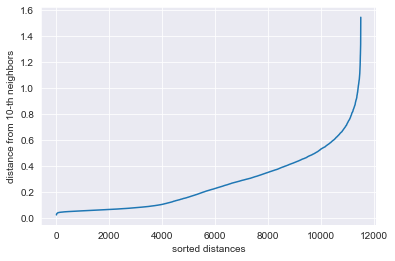

In [46]:
plt.plot(range(0, len(distances)), sorted(distances))
plt.ylabel(f'distance from {k}-th neighbors')
plt.xlabel('sorted distances')
plt.savefig('dbscan/distances_curve.png')

The knee of the curve is around 0.4, so values around this point will be investigated. Interstingle, our curve bens in the 0.1 neighborhood, hence also this zone is worth investigating.

In [47]:
min_samples = 2*len(numeric_attributes)
min_samples

74

In [48]:
table = []
for eps in tqdm([0.4,0.45,0.5, 0.525, 0.55, 0.575, 0.6, 0.65, 0.7]):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    clusters = dbscan.fit(df_merge_scaled[numeric_attributes])
    n_clusters = len(np.unique(clusters.labels_))
    silhouette, DBscore = get_metrics(df_merge_scaled[numeric_attributes], dbscan.labels_, print_out=False)
    table.append({"eps":eps, "silhouette": silhouette, "DBscore":DBscore, "n_clusters": n_clusters})

100%|██████████| 9/9 [02:03<00:00, 13.68s/it]


In [49]:
pd.DataFrame(table)

,eps,silhouette,DBscore,n_clusters
0,0.400,0.220555,1.340442,12
1,0.450,0.286059,1.439309,12
2,0.500,0.291132,1.523212,12
3,0.525,0.305972,1.528101,12
4,0.550,0.322362,1.533969,9
5,0.575,0.349881,1.650110,7
6,0.600,0.311235,1.731236,6
7,0.650,0.351746,1.982390,5
8,0.700,0.190547,2.204613,4


In [50]:
def dbscan_analysis(eps):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    clusters = dbscan.fit(df_merge_scaled[numeric_attributes])
    print(f"noise points: {(clusters.labels_==-1).sum()}")
    try:
        os.mkdir(f"dbscan/eps{eps}")
    except FileExistsError:
        pass

    scatterplot(df_merge_scaled, 'pc1', 'pc2', clusters.labels_, filename=f"dbscan/eps{eps}/scatter.png", figsize=(8,8))
    plots(df_merge_scaled, clusters.labels_, path=f"dbscan/eps{eps}", attributes=numeric_attributes)

    return clusters.labels_

noise points: 2024


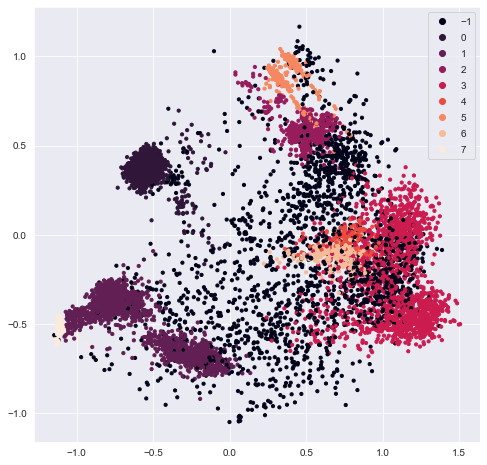

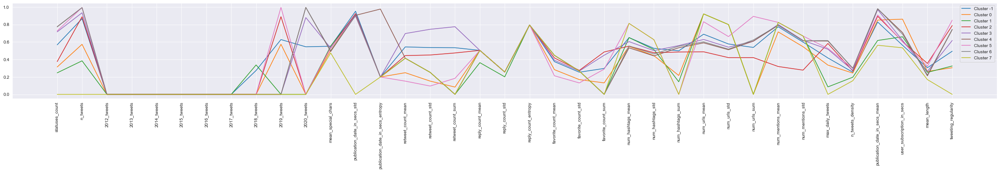

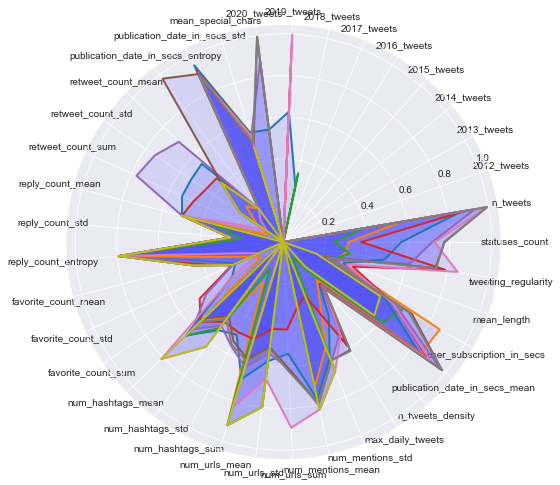

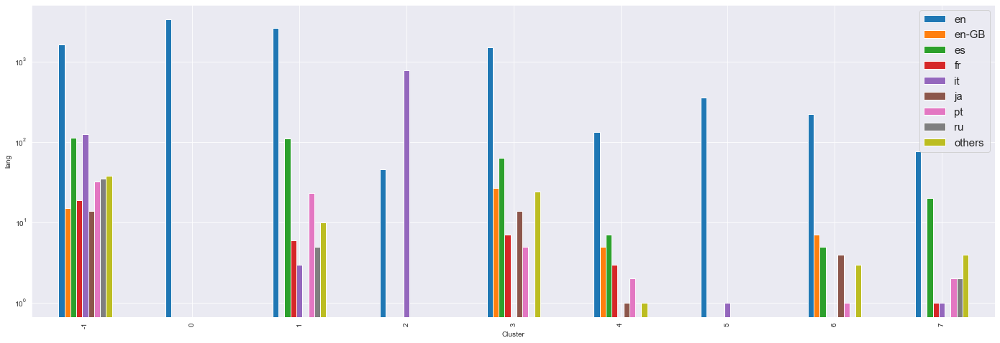

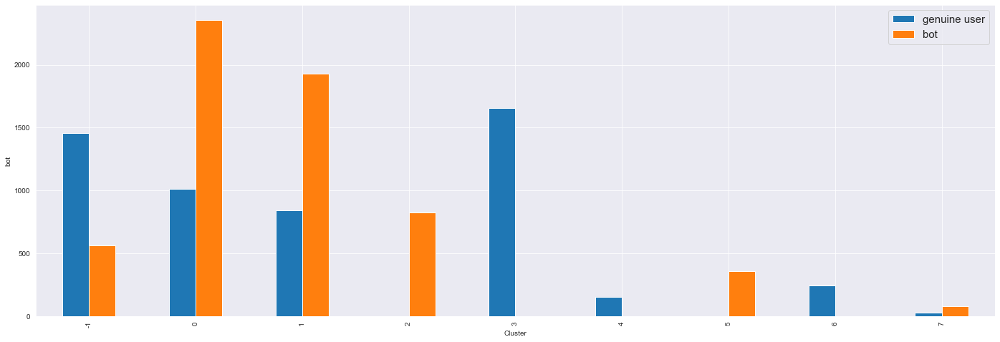

In [51]:
dbscan_labels = dbscan_analysis(0.55)

noise points: 1796


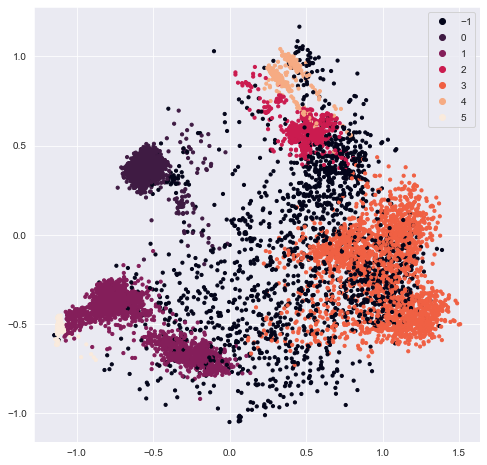

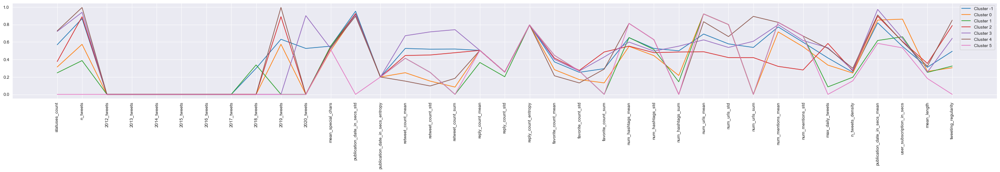

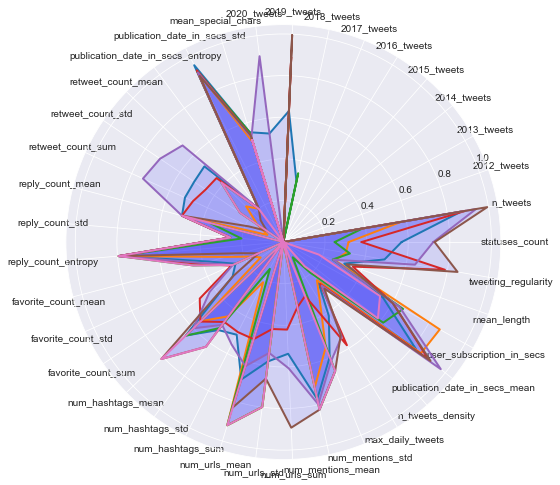

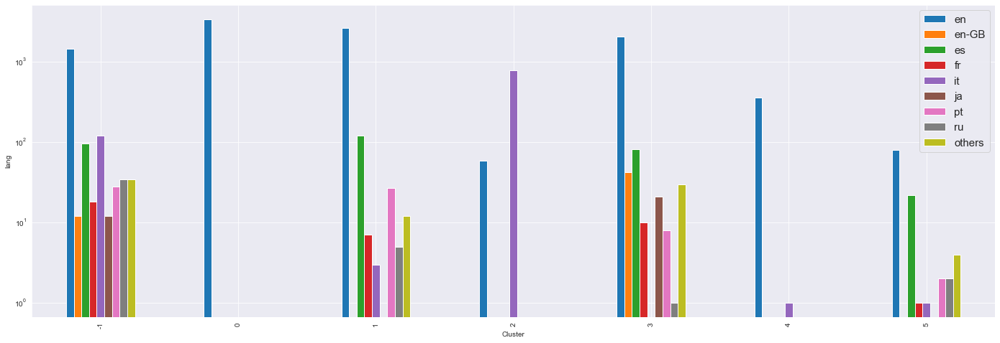

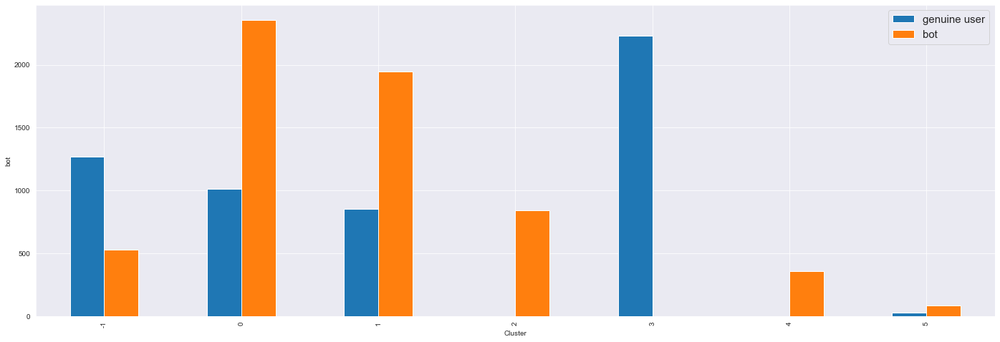

In [52]:
dbscan_labels = dbscan_analysis(0.575)

In [32]:
df_denoised = df_merge_scaled[dbscan_labels!=-1]

# KMeans

In [33]:
try:
  os.mkdir('kmeans')
except:
  pass

K means is run in two ways: with the complete set of users and removing the samples identified as noisy by DBscan

In [34]:
def find_optimal_k(df, max_k=30):
    sse_list = list()

    for k in range(2, max_k + 1):
        kmeans = KMeans(n_clusters=k, n_init=10, max_iter=300)
        kmeans.fit(df)
        sse_list.append(kmeans.inertia_)

    plt.plot(range(2, len(sse_list) + 2), sse_list)
    plt.xlabel('Number of clusters')
    plt.ylabel('SSE')
    plt.show()

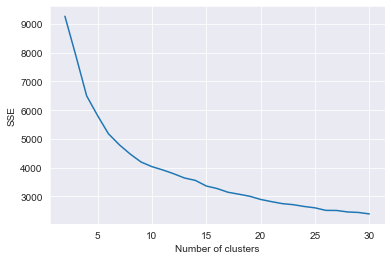

In [36]:
find_optimal_k(df_merge_scaled[numeric_attributes])

The optimal number of clusters seems to be around 9. In the following we visualize the results for k=8,9,10.

In [38]:
def kmeans_analysis(df, k, n_init=20, max_iter=300, out_dir=None, combinations=False):
    try:
        os.mkdir(out_dir)
    except FileExistsError:
        pass

    kmeans = KMeans(n_clusters=k, n_init=n_init, max_iter=max_iter)
    kmeans.fit(df[numeric_attributes])
    cent = kmeans.cluster_centers_

    get_metrics(df[numeric_attributes], kmeans.labels_)

    if combinations:
        try:
            os.mkdir(os.path.join(out_dir, 'combinations'))
        except FileExistsError:
            pass
        combs = combinations(df[numeric_attributes].columns, 2)
        os.mkdir('kmeans')
        os.mkdir('kmeans/log_denoised')
        for comb in combs:
            plt.ylabel(comb[1])
            plt.xlabel(comb[0])
            print(*comb)
            scatterplot(df, *comb, kmeans.labels_, centroids=cent,
                        filename=os.path.join(out_dir, 'combinations', f"scatterplot_{comb[1]}_{comb[0]}.png"))
    else:
        scatterplot(df, 'pc1', 'pc2', kmeans.labels_,
                    centroids=cent, filename=os.path.join(out_dir, "clusters"))

    plots(df, kmeans.labels_, path = out_dir, centroids = cent, attributes=numeric_attributes)

Silouhette score: 0.3772632859616825
Davies Bouldin score: 1.4266763800237492


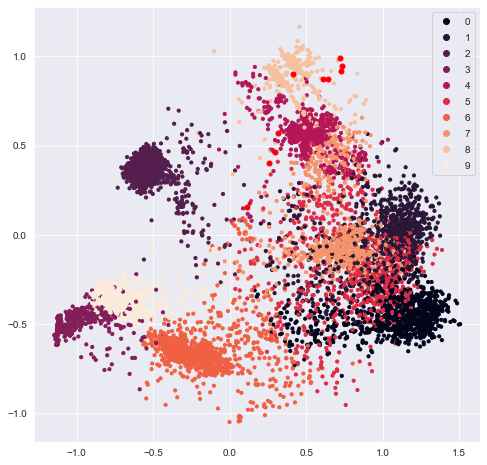

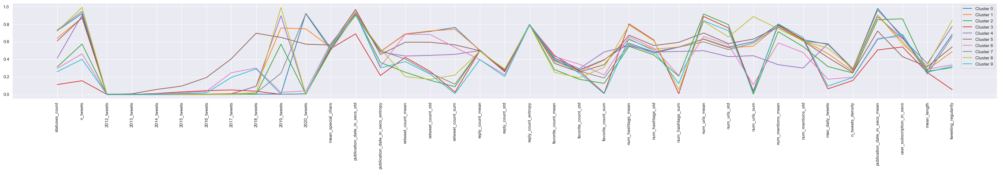

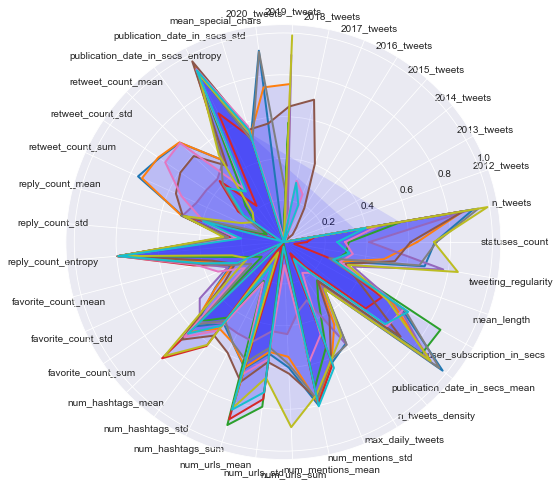

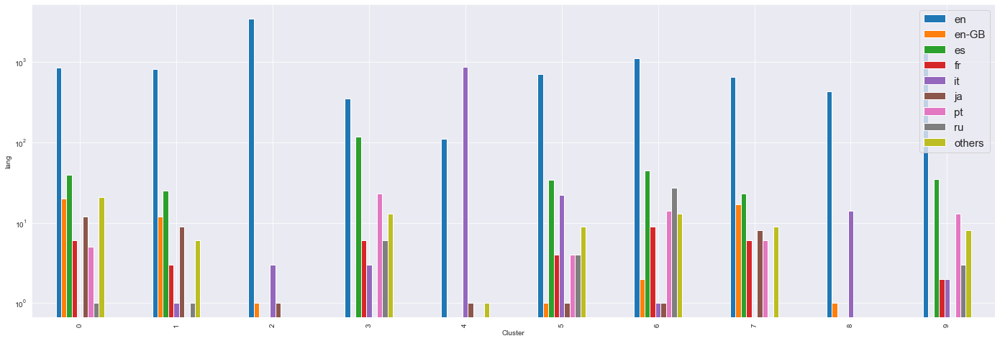

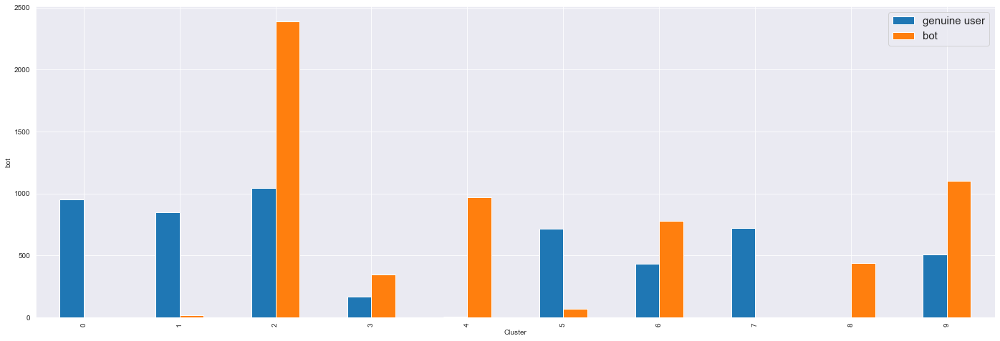

In [40]:
kmeans_analysis(df_merge_scaled, k=10, out_dir='kmeans/scaled_k10')

Silouhette score: 0.3851665133184689
Davies Bouldin score: 1.3963335564015884


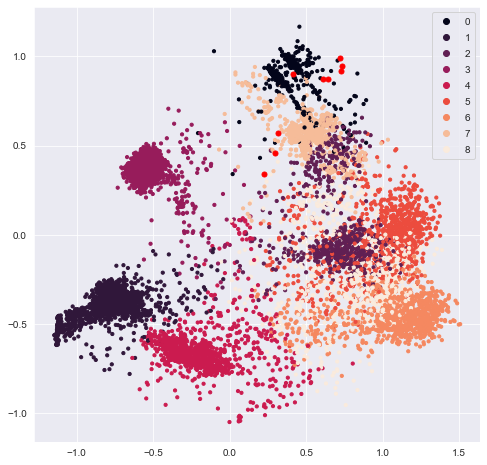

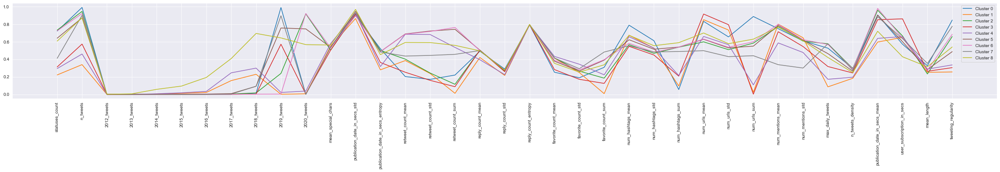

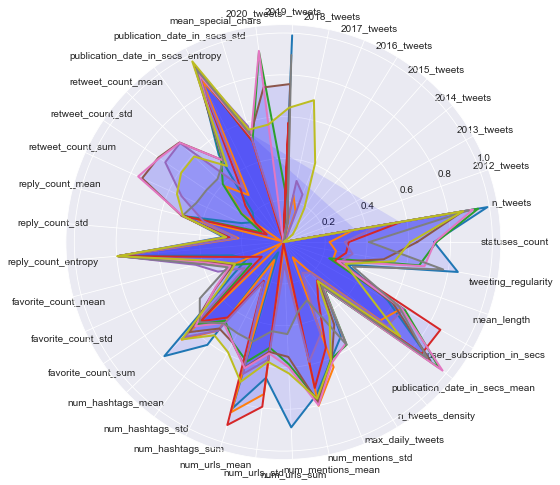

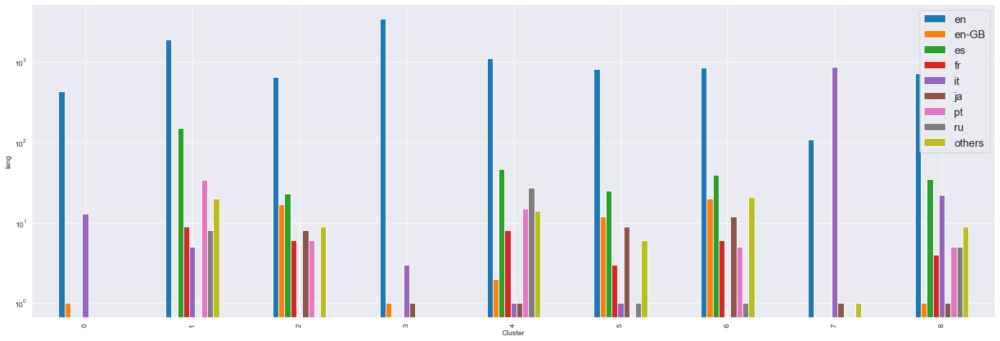

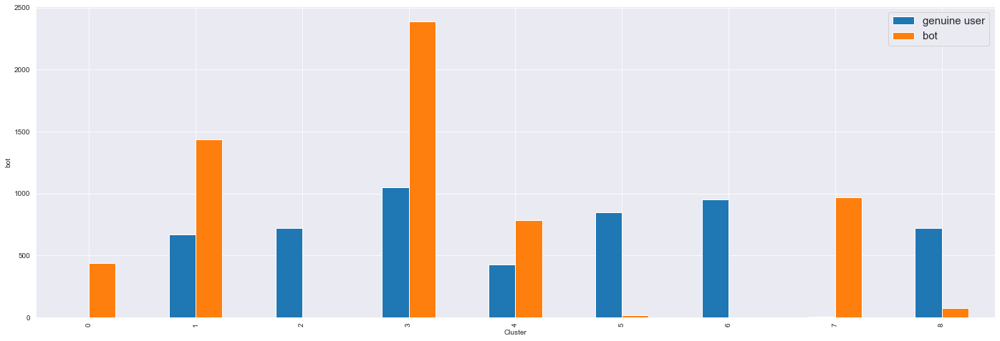

In [43]:
kmeans_analysis(df_merge_scaled, k=9, out_dir='kmeans/scaled_k9')

Silouhette score: 0.3829409468705412
Davies Bouldin score: 1.4390030516300552


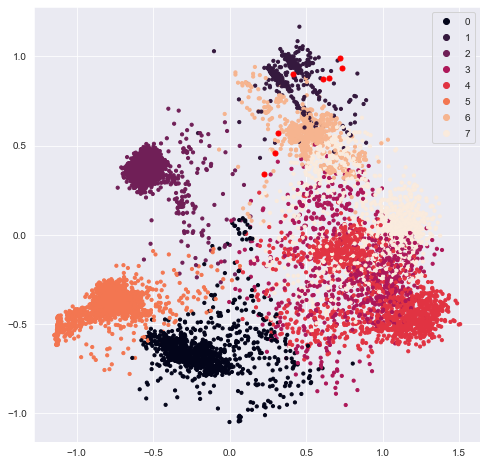

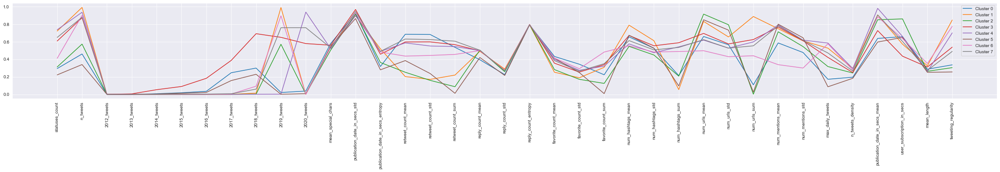

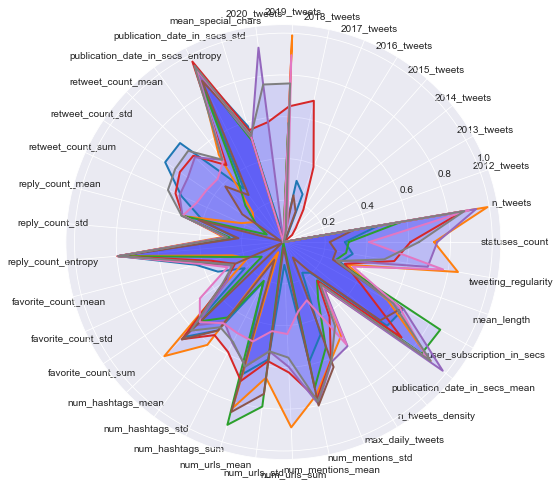

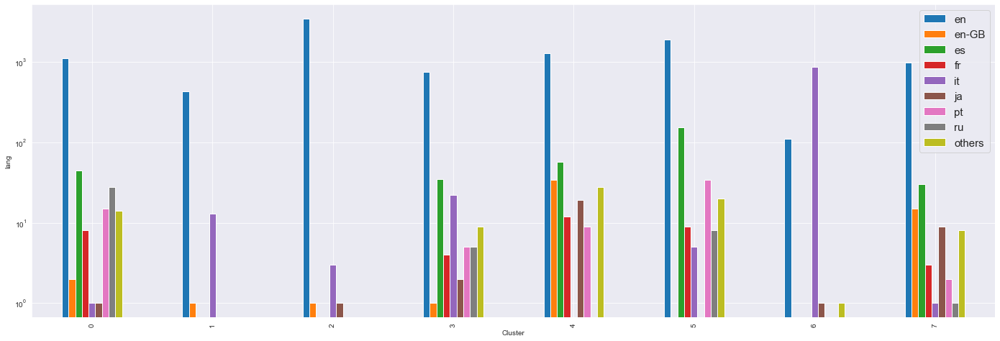

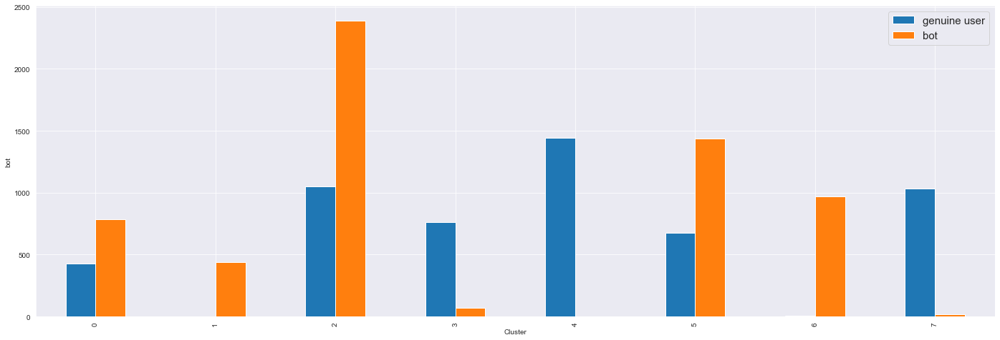

In [42]:
kmeans_analysis(df_merge_scaled, k=8, out_dir='kmeans/scaled_k8')

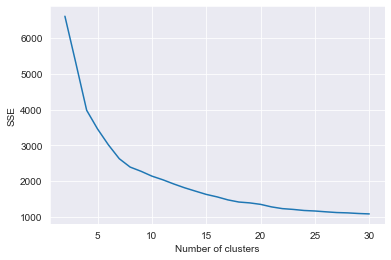

In [37]:
find_optimal_k(df_denoised[numeric_attributes])

The optimal k is around 7, in the following we visualize the results for k=6,7,8

Silouhette score: 0.4646295823834795
Davies Bouldin score: 1.1427608694392672


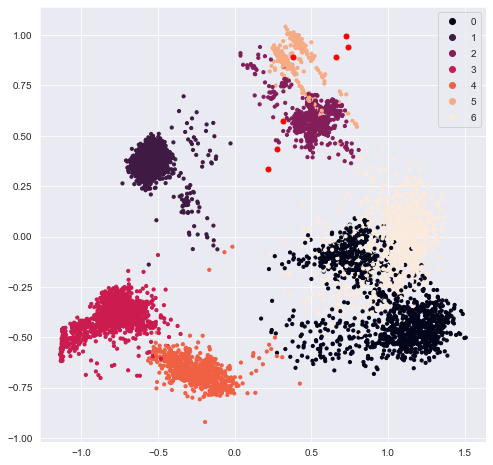

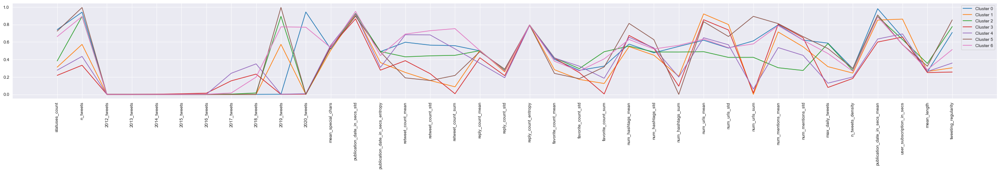

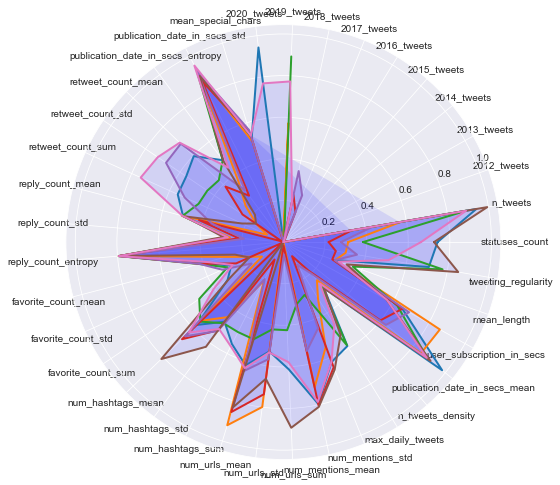

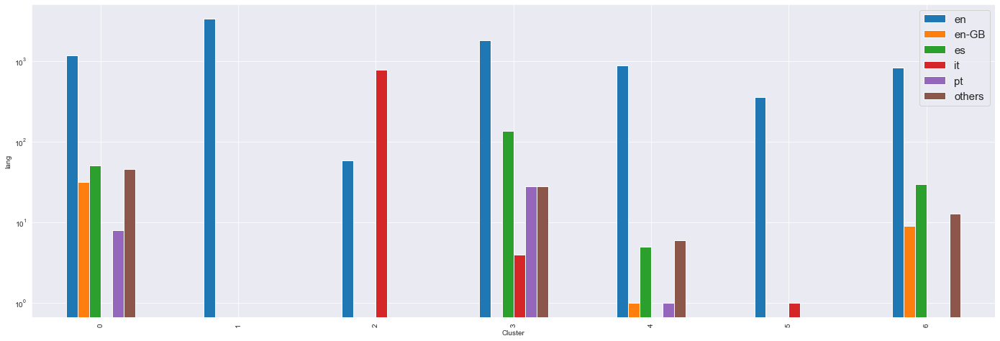

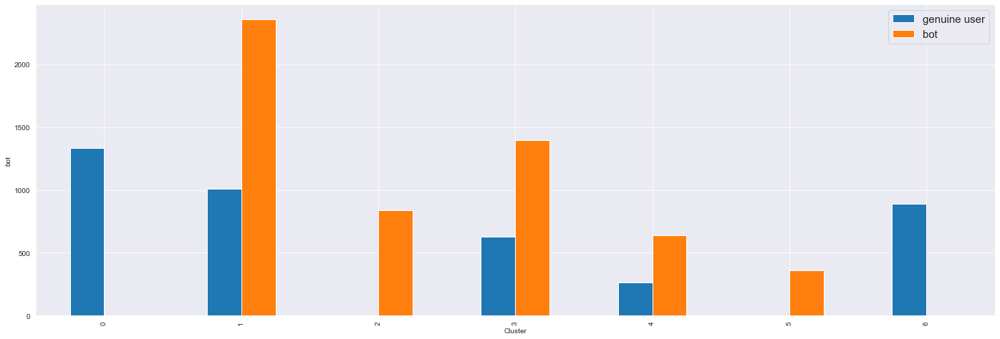

In [44]:
kmeans_analysis(df_denoised, k=7, out_dir='kmeans/denoised_k7')

Silouhette score: 0.4677502955163009
Davies Bouldin score: 1.169158402489597


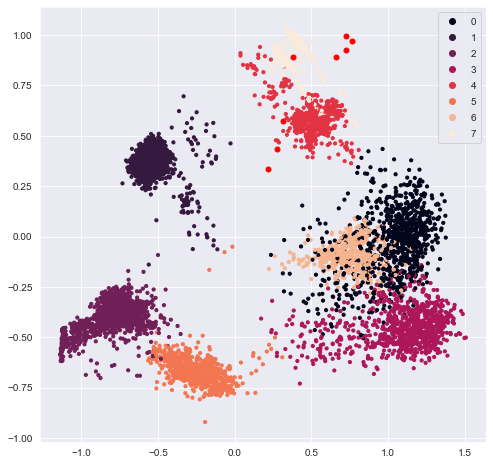

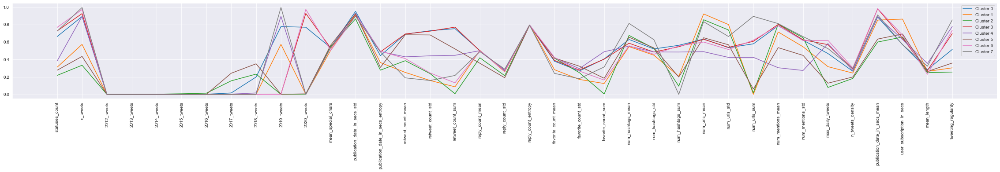

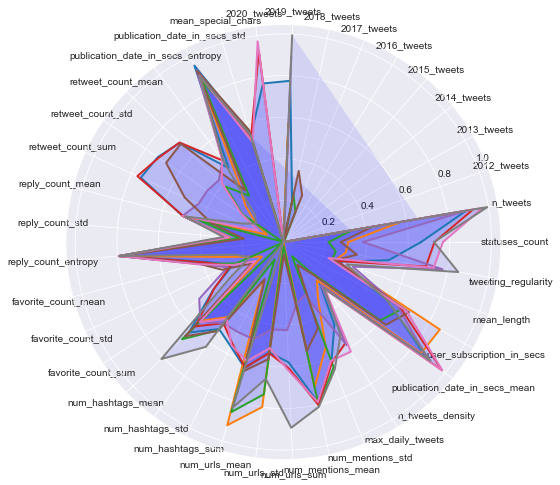

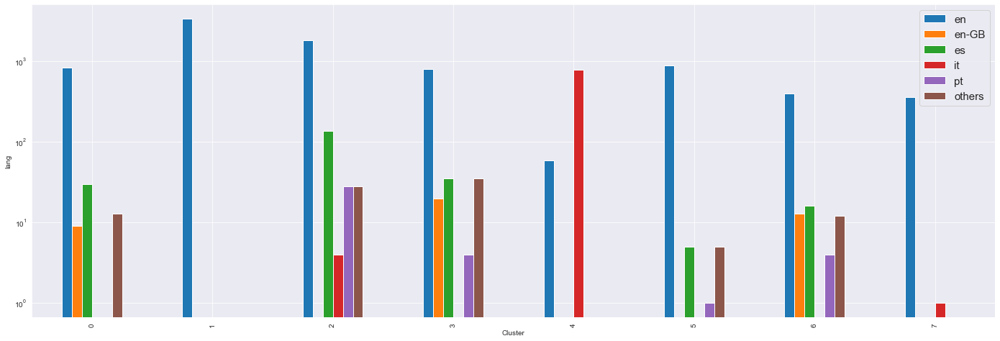

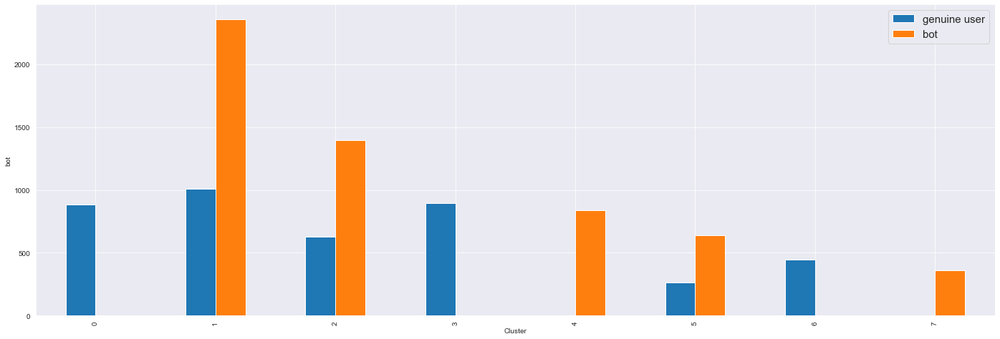

In [45]:
kmeans_analysis(df_denoised, k=8, out_dir='kmeans/denoised_k8')

Silouhette score: 0.4385631867478692
Davies Bouldin score: 1.2473203723910153


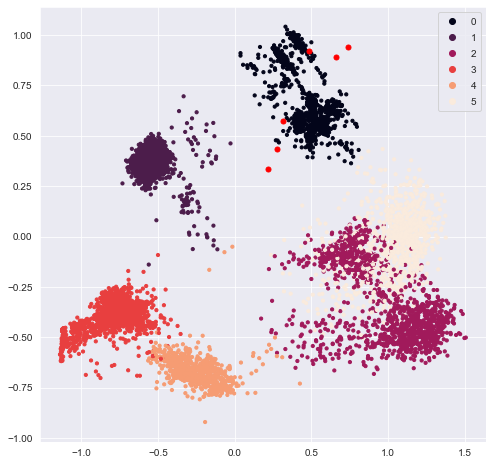

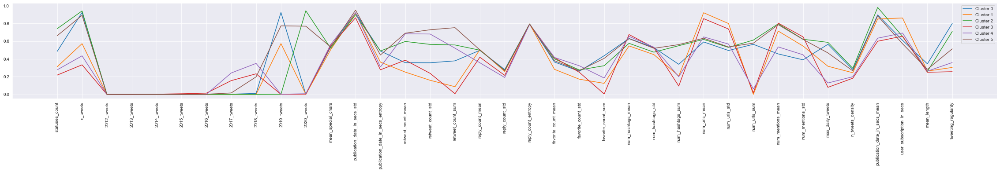

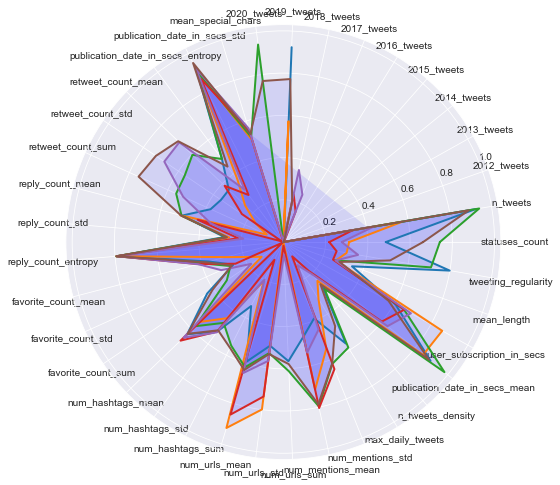

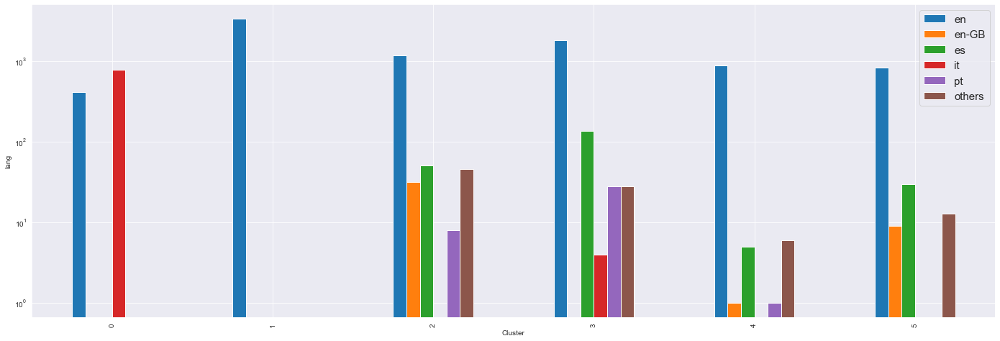

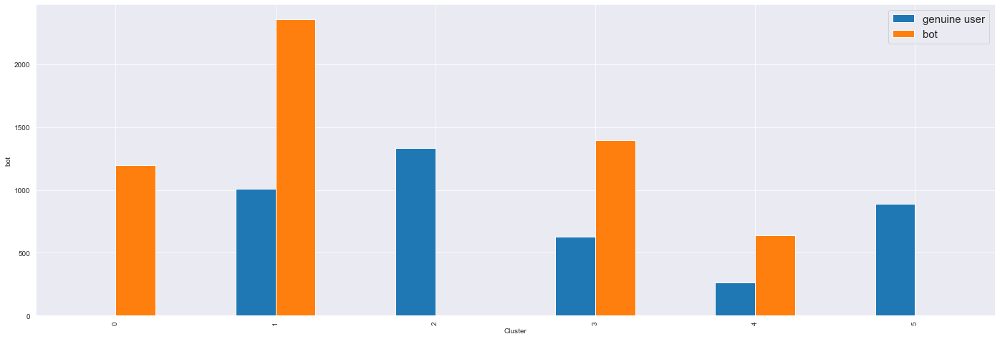

In [46]:
kmeans_analysis(df_denoised, k=6, out_dir='kmeans/denoised_k6')

# Hierarchical clustering

In [47]:
try:
  os.mkdir('hierarchical')
except FileExistsError:
  pass

In [48]:
df_merge_scaled[numeric_attributes].loc[[0,1,3]].mean()

statuses_count                      0.316112
n_tweets                            0.677476
2012_tweets                         0.000000
2013_tweets                         0.000000
2014_tweets                         0.000000
2015_tweets                         0.000000
2016_tweets                         0.000000
2017_tweets                         0.000000
2018_tweets                         0.000000
2019_tweets                         0.678048
2020_tweets                         0.000000
mean_special_chars                  0.513220
publication_date_in_secs_std        0.918794
publication_date_in_secs_entropy    0.198781
retweet_count_mean                  0.292158
retweet_count_std                   0.234657
retweet_count_sum                   0.192111
reply_count_mean                    0.503491
reply_count_std                     0.256056
reply_count_entropy                 0.794085
favorite_count_mean                 0.302073
favorite_count_std                  0.186173
favorite_c

In [49]:
def hierarchical_analysis(df,metric, method, truncate_mode, p, n_clusters, directory, plot=False):
    df = df.reset_index()
    distances = pdist(df[numeric_attributes], metric=metric)
    dlinkage = linkage(distances, metric=metric, method=method)

    labels = fcluster(dlinkage,n_clusters,criterion='maxclust')
    if plot:
        try:
            os.mkdir(os.path.join('hierarchical',directory))
        except FileExistsError:
            pass

        dendrogram(dlinkage, truncate_mode=truncate_mode, p=p, leaf_rotation=90)
        plt.savefig(os.path.join('hierarchical',directory,"dendrogram.png"))
        plt.show()
        scatterplot(df[numeric_attributes+['pc1','pc2']], 'pc1','pc2',c_labels=labels,filename=os.path.join('hierarchical',directory, 'scatterplot.png'))

        plots(df, labels, os.path.join('hierarchical',directory), attributes=numeric_attributes)


    #print(f"SSE: {sse(df[numeric_attributes],labels)}")
    if len(labels) > 1:
        try:
            return get_metrics(df[numeric_attributes], labels, print_out=False)
        except:
            return 0,0
    else: return 0,0

In [50]:
def hierarchial_gs(df):
    table = PrettyTable(colums=['metric','method','truncation_mode','truncation_level','n_clustes','sse',])
    for metric in ['cityblock','correlation', 'cosine', 'dice', 'euclidean']:
        methods = ['complete','single','average','weighted']
        if metric == 'euclidean':
            methods += ['ward','median','centroid']
        for method in methods:
            for truncation_mode in [None, 'lastp','level']:
                for level in [2,3,4]:
                    for k in [7,8,9,10]:
                        metrics = hierarchical_analysis(df[numeric_attributes], metric, method, truncate_mode=truncation_mode, p=level, n_clusters=k,
                                                           directory=f'hierarchical/{metric}_{method}_{truncation_mode}_{level}_{k}')
                        table.add_row([metric, method, truncation_mode, level, k, *metrics])
    print(table)

In [51]:
#hierarchial_gs(df_merge_scaled)

|  euclidean  | centroid |  level  |    4    |    8    |  0.23683322871264656  | 0.6957750301079821 |
|  euclidean  | centroid |  level  |    4    |    7    |   0.2587391353800509  | 0.7143377294957671 |
|  euclidean  |   ward   |   None  |    4    |    10   |  0.32528308553781576  | 1.5993941733422534 |
|  euclidean  |   ward   |   None  |    4    |    10   |  0.32528308553781576  | 1.5993941733422534 |
|  euclidean  | weighted |  lastp  |    2    |    8    |   0.2931433199083441  | 1.4713046016118956 |
|  euclidean  |  single  |  lastp  |    2    |    9    |  0.18279600083572384  | 0.5517771198190936 |
|    cosine   | average  |  level  |    3    |    9    |  0.23279880210801807  | 1.1422942948774821 |
| correlation | average  |  level  |    3    |    7    |  0.25115822395397913  | 0.8985090713314801 |

This approach is tested on both noisy and denoised data.

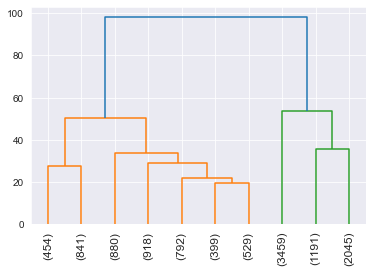

(0.3690212167511685, 1.477131781848148)

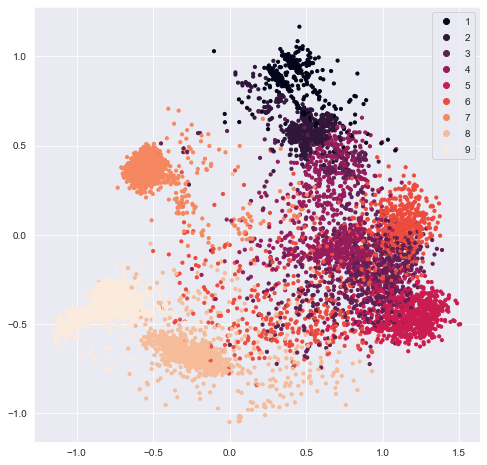

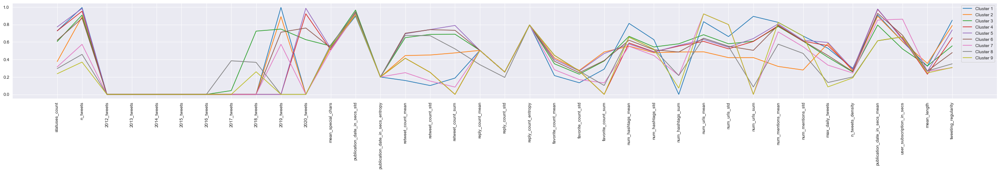

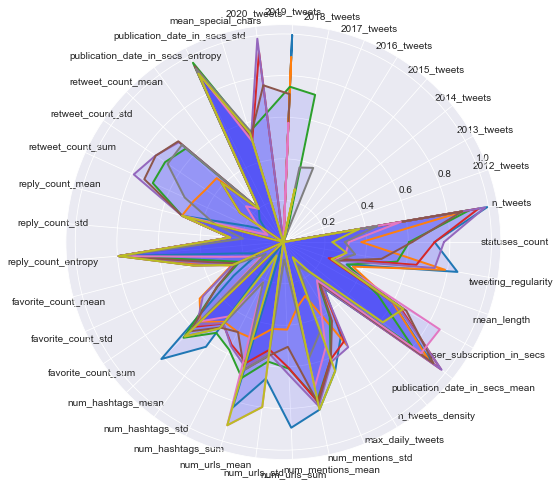

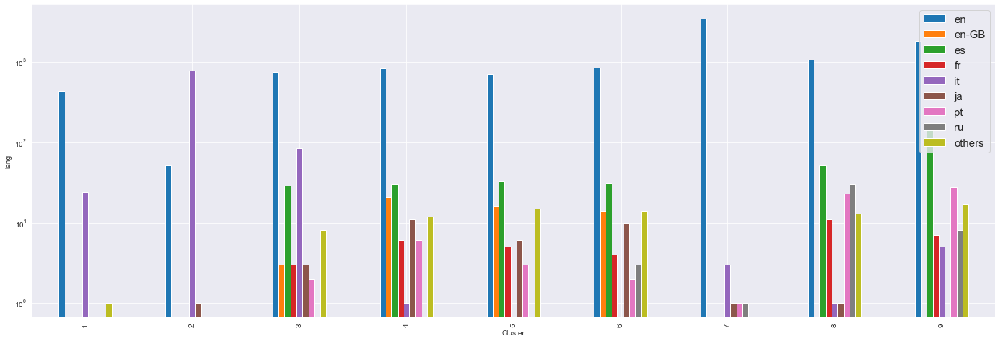

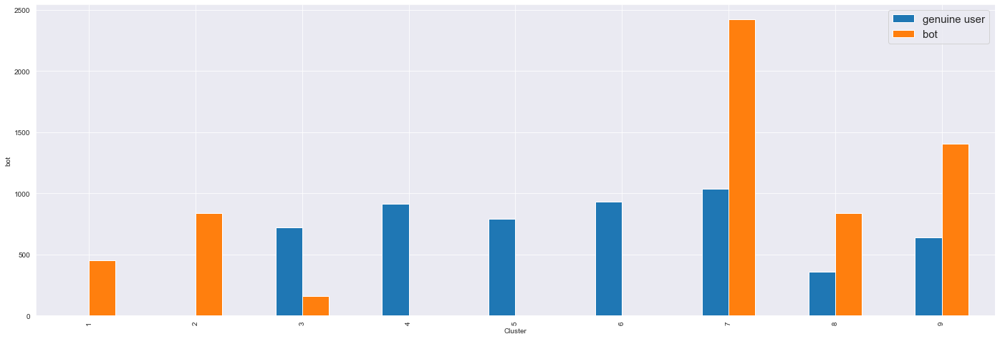

In [56]:
hierarchical_analysis(df_merge_scaled,'euclidean','ward','lastp',p=10,n_clusters=9,directory='euclidean_ward_k9_p4',plot=True)

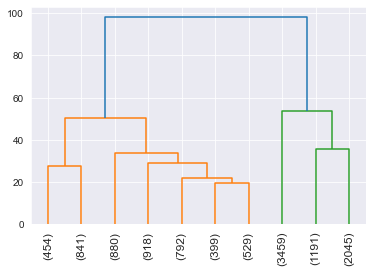

(0.37428050722043504, 1.427441360875183)

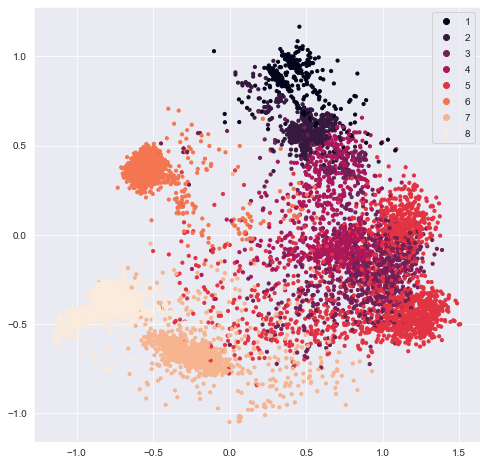

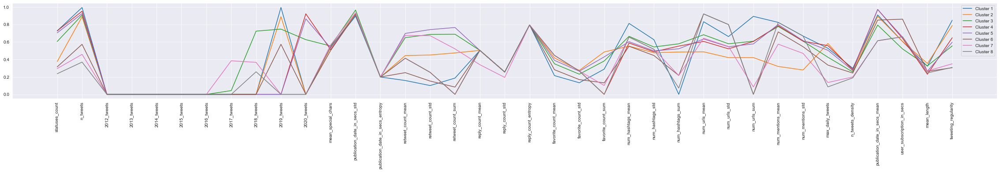

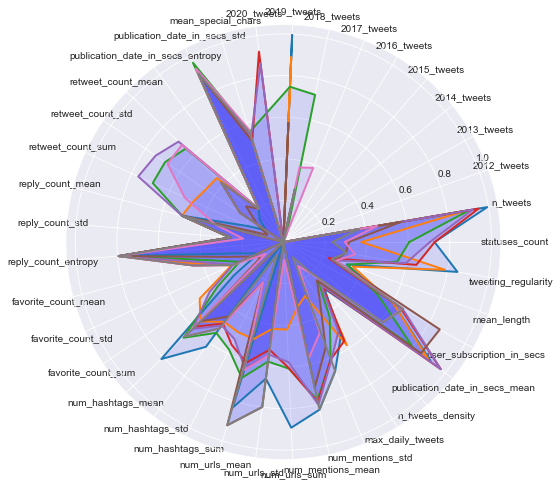

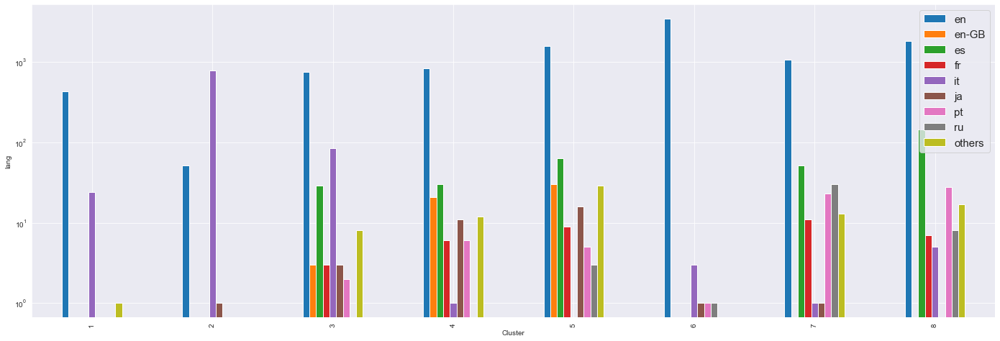

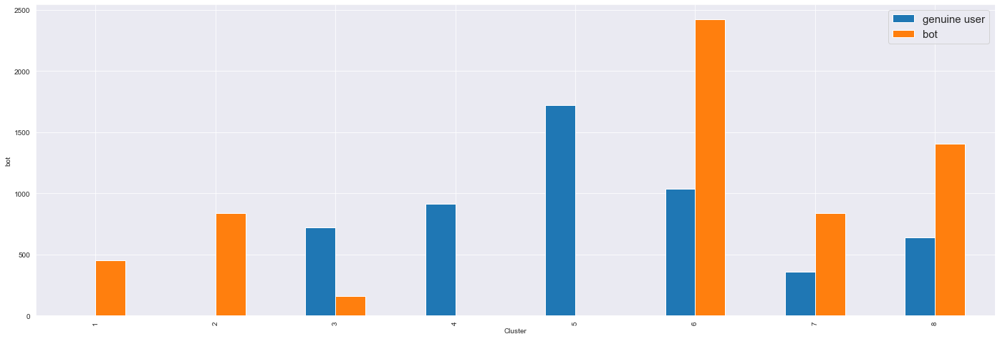

In [58]:
hierarchical_analysis(df_merge_scaled,'euclidean','ward','lastp',p=10,n_clusters=8,directory='euclidean_ward_k8_p4',plot=True)

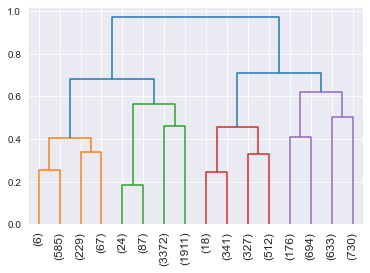

(0.42969070247095337, 1.3148249566083892)

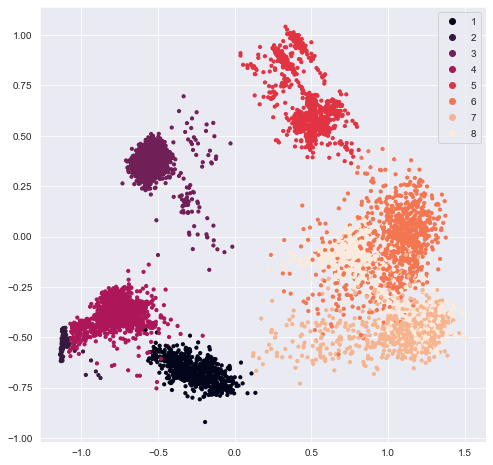

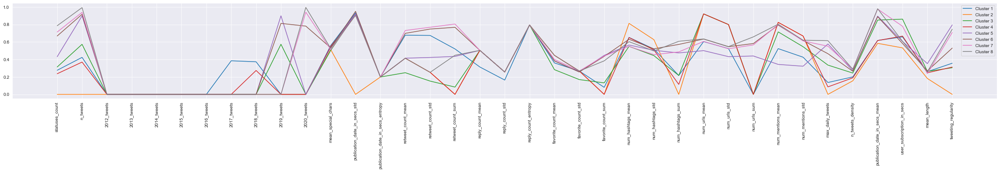

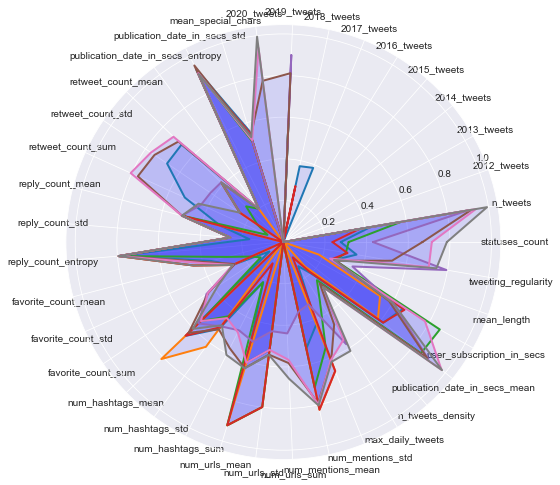

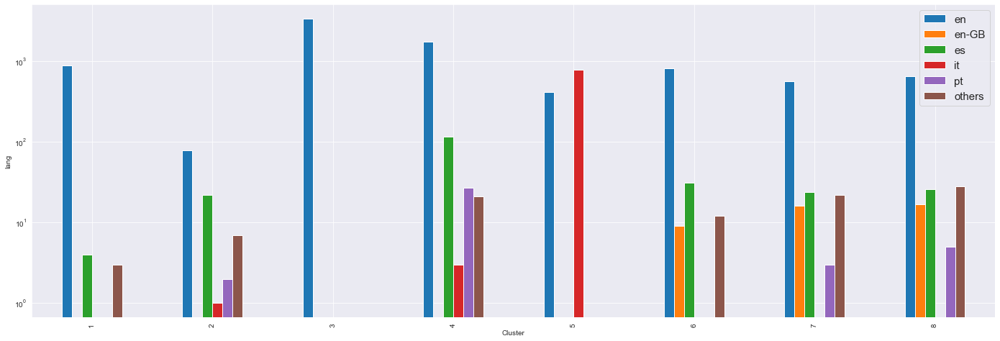

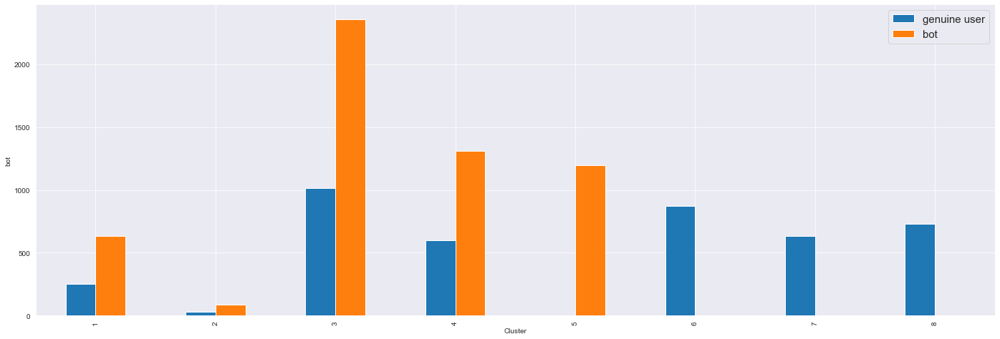

In [54]:
hierarchical_analysis(df_denoised,'correlation','complete','level',p=3,n_clusters=8,directory='denoised_correlation_k10',plot=True)

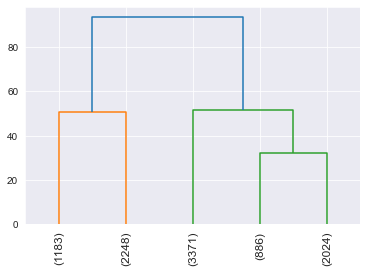

(0.46391826962344956, 1.1473251269500722)

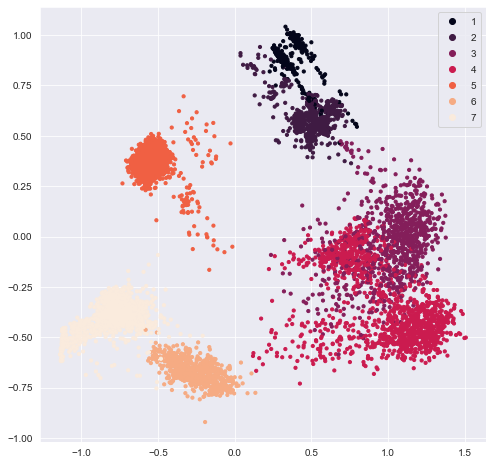

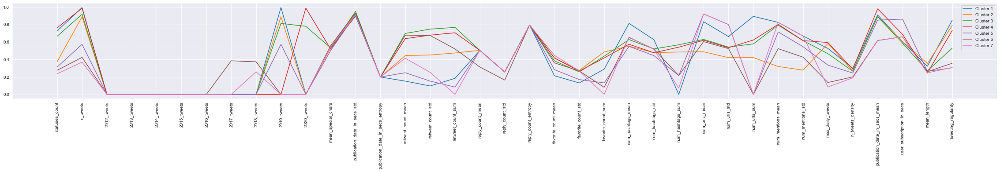

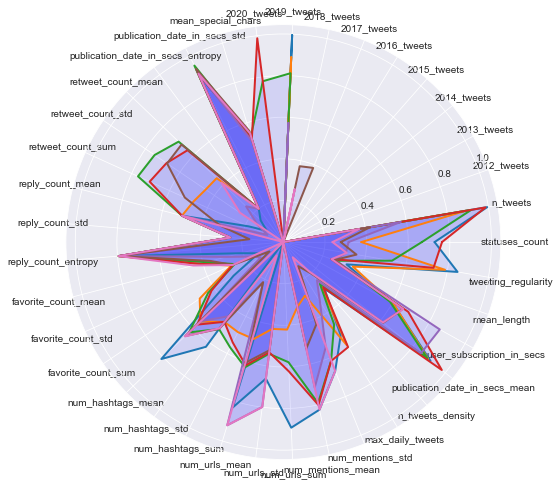

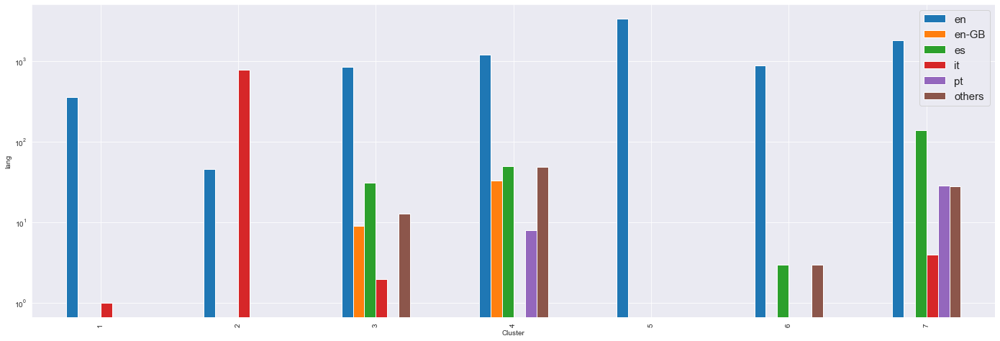

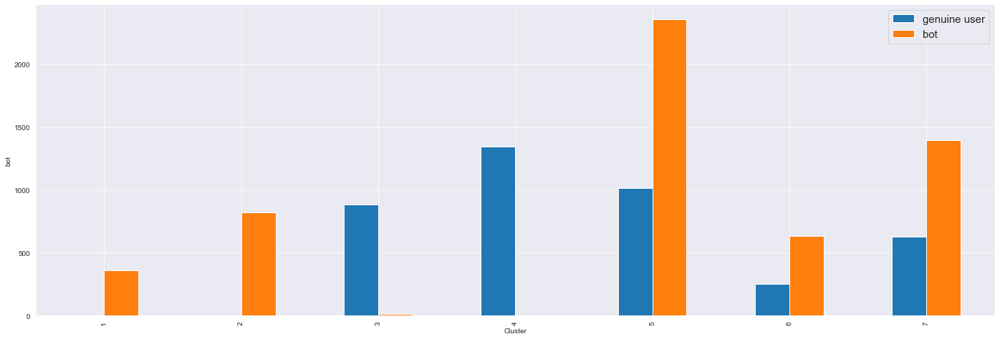

In [59]:
hierarchical_analysis(df_denoised,'euclidean','ward','lastp',p=5,n_clusters=7,directory='denoised_ward_k7',plot=True)

# Agglomerative clustering

In [62]:
try:
    os.mkdir("agglomerative")
except FileExistsError:
    pass

In [67]:
def agglomerative_analysis(df, n_clusters, metric='euclidean', linkage='ward'):
    clusters = AgglomerativeClustering(affinity=metric, n_clusters=n_clusters, linkage=linkage)
    clusters.fit(df[numeric_attributes])

    path=f'agglomerative/{metric}_{linkage}_k{n_clusters}/'
    get_metrics(df[numeric_attributes], clusters.labels_)
    plots(df, clusters.labels_, path=path, attributes=numeric_attributes)
    plt.show()
    scatterplot(df, 'pc1', 'pc2', clusters.labels_,filename=os.path.join(path,'scatterplot.png'))

Silouhette score: 0.3690212167511685
Davies Bouldin score: 1.4771317818481478


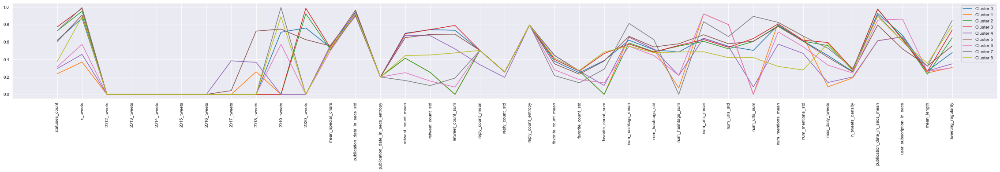

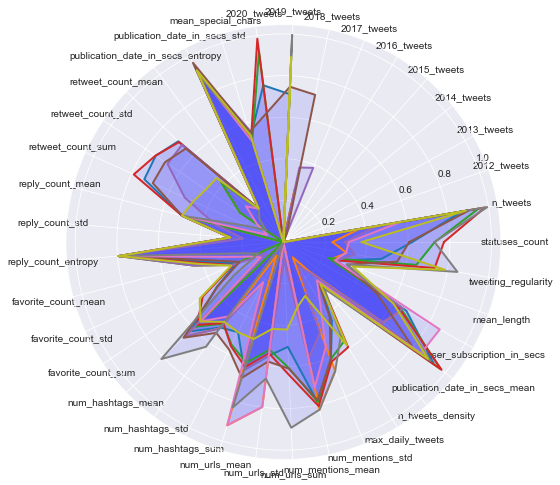

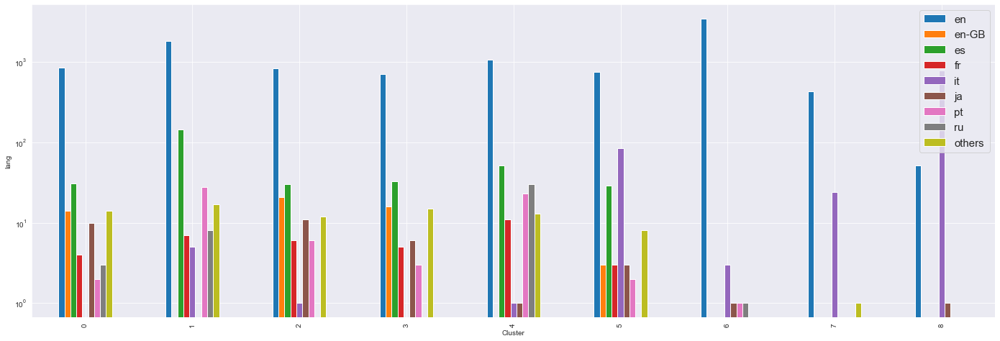

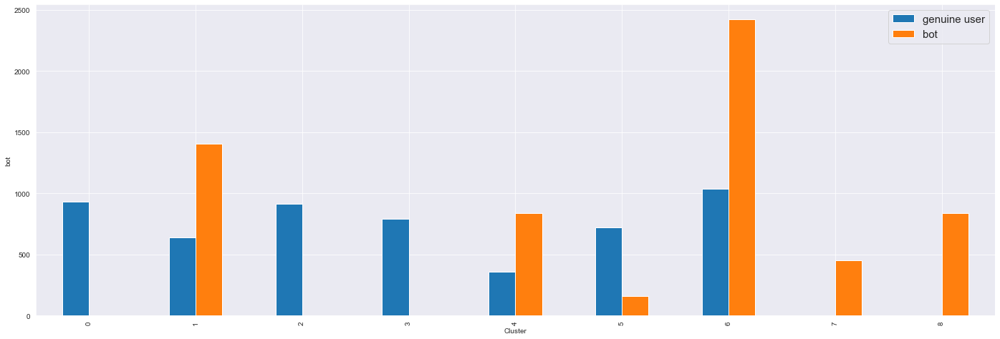

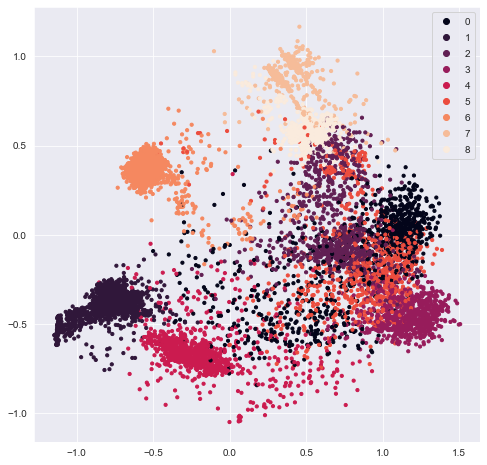

In [68]:
agglomerative_analysis(df_merge_scaled,9)

Silouhette score: 0.3573964908822856
Davies Bouldin score: 1.5165310930542497


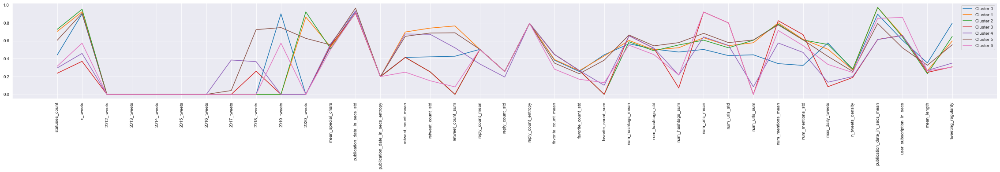

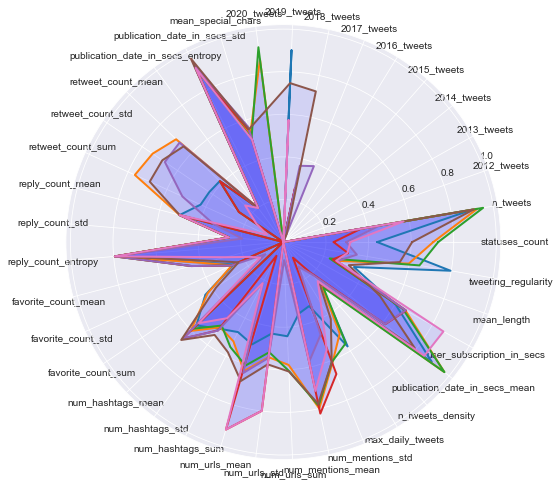

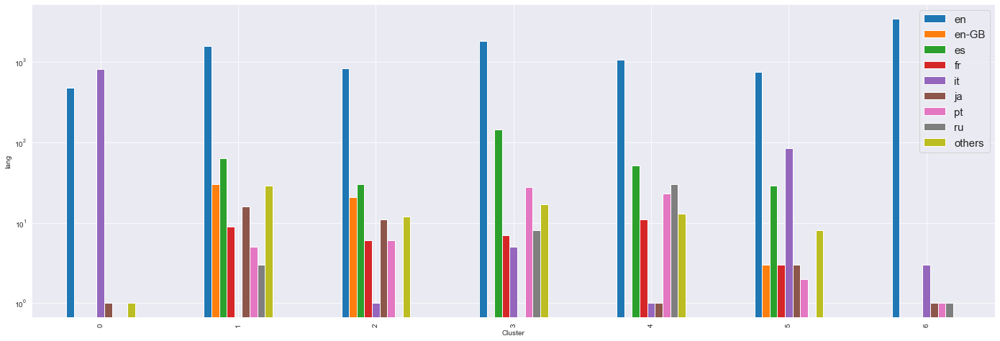

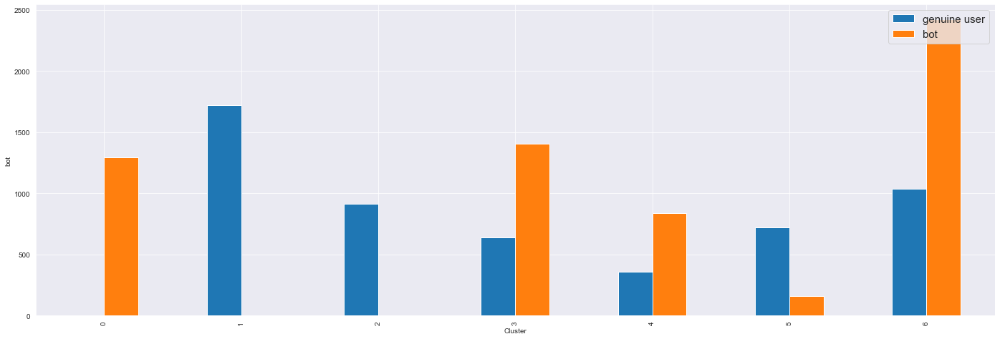

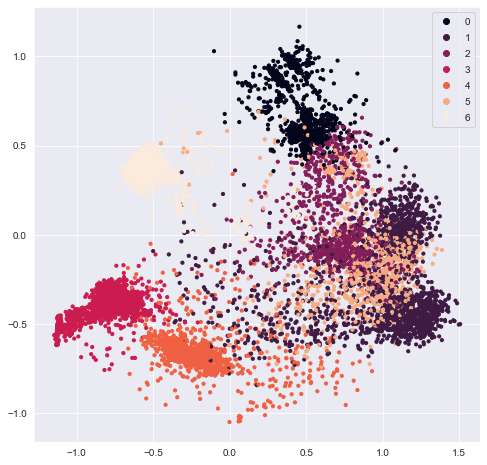

In [64]:
agglomerative_analysis(df_merge_scaled,7)

Silouhette score: 0.46391826962344956
Davies Bouldin score: 1.1473251269500706


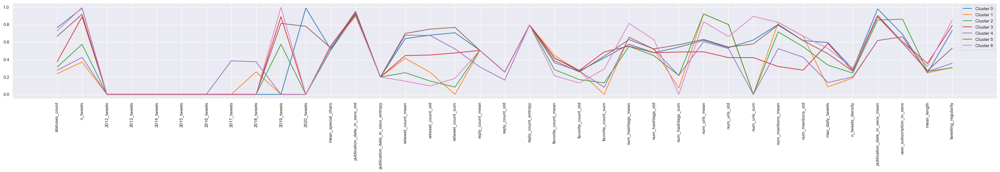

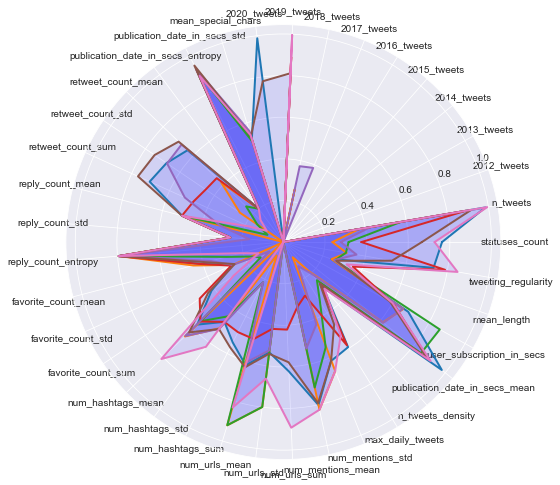

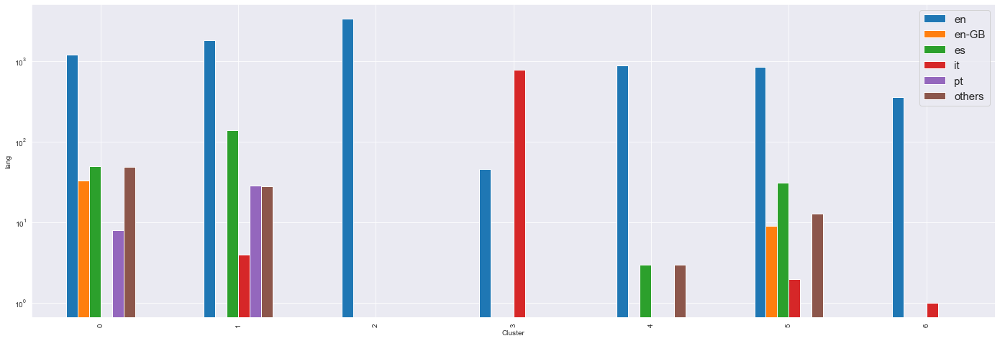

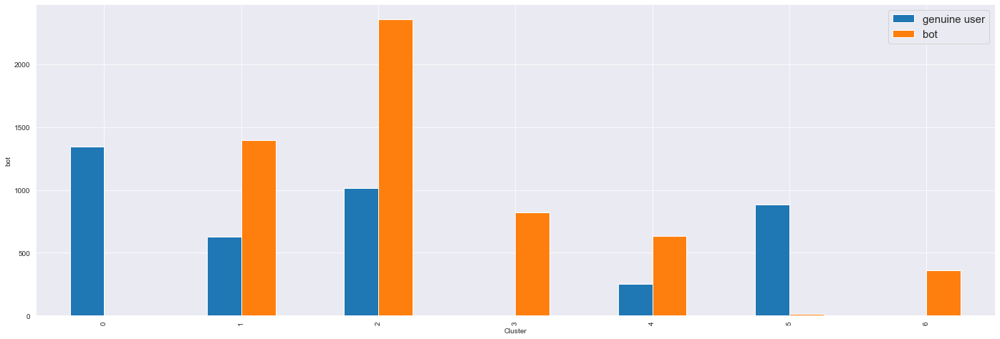

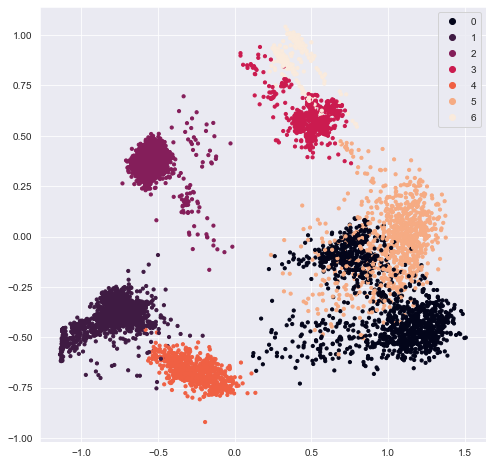

In [71]:
agglomerative_analysis(df_denoised.reset_index(),7)

# X-Means

from https://github.com/annoviko/pyclustering/

In [72]:
try:
  os.mkdir('xmeans')
except:
  pass

In [73]:

from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer

k_start = 2
clusters_start = kmeans_plusplus_initializer(df_merge_scaled[numeric_attributes], 7).initialize()
 
# By defeault max # of clusters is 20, but we set it to 10
x_means = xmeans(df_merge_scaled[numeric_attributes], clusters_start, tolerance=1000000, kmax=9, repeat=300) #, initial_centers, 20)
x_means.process()
 
# Extract clustering results: clusters and their centers
clusters = x_means.get_clusters()
centroids = x_means.get_centers()

print(f'Number of clusters found:', np.shape(centroids)[0])

Number of clusters found: 100


In [74]:
cluster_labels = dict()

''' 
Since for each cluster is saved the index in list of data
it is needed to convert it in such a way that
we have a list as long as the data, and in each
position it is saved the corresponding label for the
data with that index
'''
for label in range(0, np.shape(clusters)[0]):
  for i in range(0, len(clusters[label])):
    cluster_labels[clusters[label][i]] = label

cluster_labels = dict(sorted(cluster_labels.items()))

C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


In [75]:
print("SSE:", x_means.get_total_wce())
get_metrics(df_merge_scaled[numeric_attributes], list(cluster_labels.values()))

SSE: 1645.0240023781591
Silouhette score: 0.18809565573591927
Davies Bouldin score: 1.6176977910078723


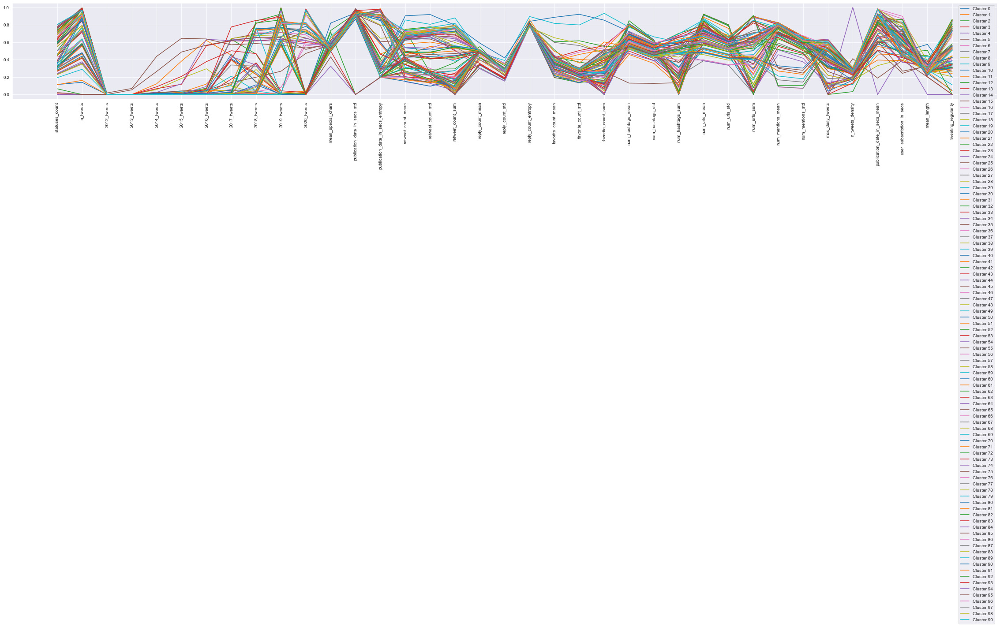

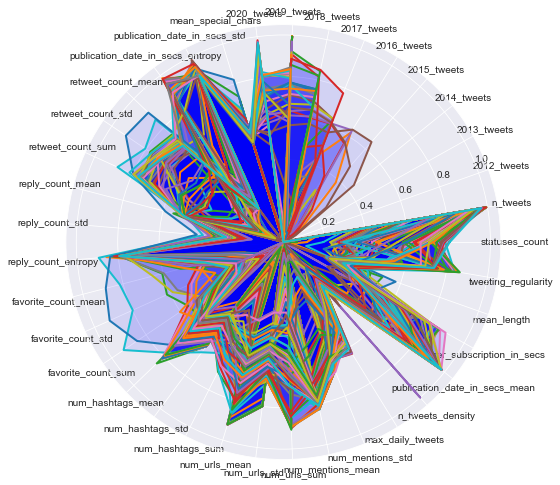

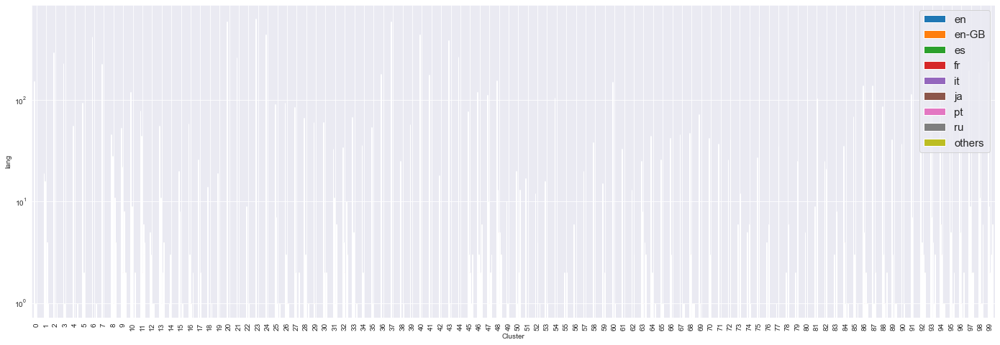

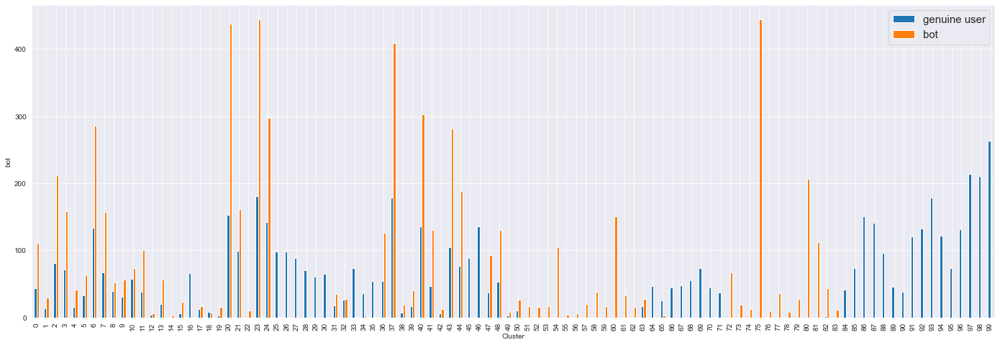

In [76]:
plots(df_merge_scaled, np.array(list(cluster_labels.values())), path='xmeans', centroids=np.array(centroids), attributes = numeric_attributes)

# G-means

In [80]:
from pyclustering.cluster import cluster_visualizer
from pyclustering.cluster.gmeans import gmeans
from pyclustering.utils import read_sample
from pyclustering.samples.definitions import FCPS_SAMPLES
# Read sample 'Lsun' from file.
sample = df_merge_scaled[numeric_attributes].values
# Create instance of G-Means algorithm. By default algorithm start search from single cluster.
gmeans_instance = gmeans(sample, tolerance=1e-12, repeat=20, k_max=9).process()
# Extract clustering results: clusters and their centers
clusters = gmeans_instance.get_clusters()
centers = gmeans_instance.get_centers()
# Print total sum of metric errors
print("Total WCE:", gmeans_instance.get_total_wce())

Total WCE: 4345.245383825703


In [81]:
len(centers)

9

C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


SSE: 1645.0240023781591
Silouhette score: 0.3302811192370132
Davies Bouldin score: 1.3660162422484374


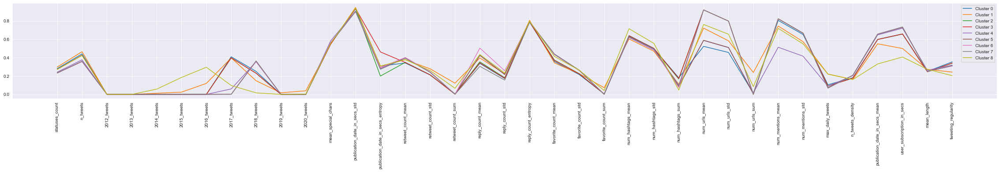

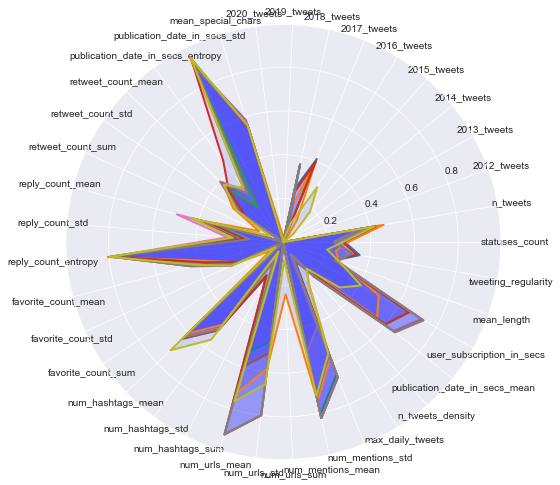

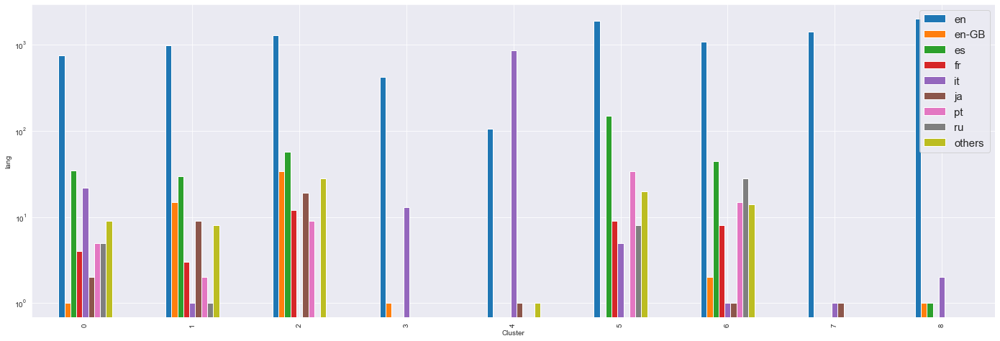

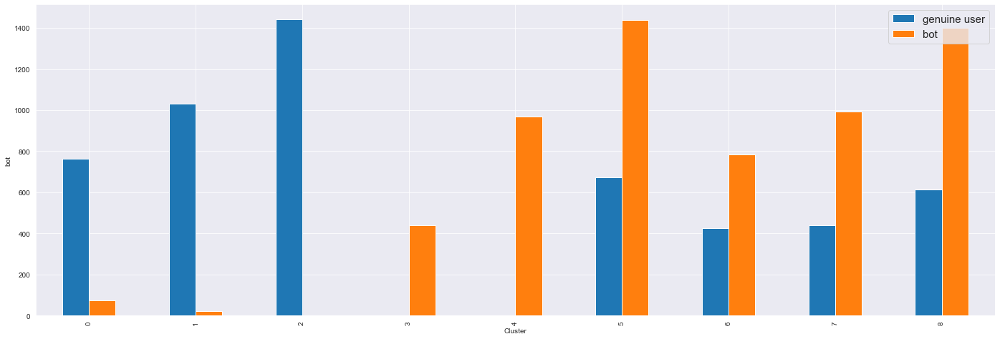

In [82]:
cluster_labels = dict()

'''
Since for each cluster is saved the index in list of data
it is needed to convert it in such a way that
we have a list as long as the data, and in each
position it is saved the corresponding label for the
data with that index
'''
for label in range(0, np.shape(clusters)[0]):
    for i in range(0, len(clusters[label])):
        cluster_labels[clusters[label][i]] = label

cluster_labels = dict(sorted(cluster_labels.items()))
print("SSE:", x_means.get_total_wce())
get_metrics(df_merge_scaled[numeric_attributes], list(cluster_labels.values()))
plots(df_merge_scaled, np.array(list(cluster_labels.values())), path='gmeans', centroids=np.array(centroids),
      attributes=numeric_attributes)

# CURE

In [83]:
try:
    os.mkdir('cure')
except:
    pass

In [84]:
def run_cure_combo(n_clusters, n_represent_points, compression):
    # create instance of cure algorithm for cluster analysis
    # request for allocation of two clusters.
    cure_instance = cure(df_merge_scaled[numeric_attributes].values, n_clusters, n_represent_points, compression, True)
    # run cluster analysis
    cure_instance.process()
    # get results of clustering
    clusters = cure_instance.get_clusters()

    print(f'Number of clusters found:', np.shape(centroids)[0])

    cluster_labels = dict()

    '''
    Since for each cluster is saved the index in list of data
    it is needed to convert it in such a way that
    we have a list as long as the data, and in each
    position it is saved the corresponding label for the
    data with that index
    '''
    for label in range(0, np.shape(clusters)[0]):
        for i in range(0, len(clusters[label])):
            cluster_labels[clusters[label][i]] = label

    cluster_labels = dict(sorted(cluster_labels.items()))

    print("SSE:", x_means.get_total_wce())
    get_metrics(df_merge_scaled[numeric_attributes], list(cluster_labels.values()))

    subdir_name = f'{n_clusters}_{n_represent_points}_{compression}'
    plots(df_merge_scaled, np.array(list(cluster_labels.values())), path=f'cure/{subdir_name}', centroids=np.array(centroids), attributes = numeric_attributes)

In [ ]:
n_clusters_list = [7,10,13]
n_represent_points_list = [25, 50]
compression_list = [0.25,0.5,0.75]
for n_clusters in n_clusters_list:
    for n_represent_points in n_represent_points_list:
        for compression in compression_list:
            print(f'{n_clusters} \t {n_represent_points} \t {compression}')
            run_cure_combo(n_clusters, n_represent_points, compression)
            print('------------------------------------------------------------')

7 	 25 	 0.25
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.12103494867558598
Davies Bouldin score: 0.7244556336420865
------------------------------------------------------------
7 	 25 	 0.5
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.12239263932802767
Davies Bouldin score: 0.7236035541873368
------------------------------------------------------------
7 	 25 	 0.75
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.26297876359025874
Davies Bouldin score: 0.5920514356833818
------------------------------------------------------------
7 	 50 	 0.25
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.17539517820220904
Davies Bouldin score: 0.690517245972968
------------------------------------------------------------
7 	 50 	 0.5
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.17180807758897143
Davies Bouldin score: 0.6917486963664977
------------------------------------------------------------
7 	 50 	 0.75
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.26297876359025874
Davies Bouldin score: 0.5920514356833818


C:\dev\DM_tweets\DM_11_TASK2\clusteringUtilities.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(40, 4))


------------------------------------------------------------
10 	 25 	 0.25
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.04325117754091034
Davies Bouldin score: 0.7131240134634498
------------------------------------------------------------
10 	 25 	 0.5
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.1161633096983566
Davies Bouldin score: 0.6736328252953347
------------------------------------------------------------
10 	 25 	 0.75
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.1409596703491667
Davies Bouldin score: 0.6555026899236246
------------------------------------------------------------
10 	 50 	 0.25
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.10380836607624441
Davies Bouldin score: 0.6795320078180337
------------------------------------------------------------
10 	 50 	 0.5
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.13573478883437562
Davies Bouldin score: 0.6560774769391295
------------------------------------------------------------
10 	 50 	 0.75
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.1409596703491667
Davies Bouldin score: 0.6555026899236245
------------------------------------------------------------
13 	 25 	 0.25
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.025659158651879024
Davies Bouldin score: 0.6836009286653639
------------------------------------------------------------
13 	 25 	 0.5
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.08971735515763347
Davies Bouldin score: 0.6573129052729405
------------------------------------------------------------
13 	 25 	 0.75
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.08008043354317332
Davies Bouldin score: 0.6714652871005935
------------------------------------------------------------
13 	 50 	 0.25
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.08971495559322432
Davies Bouldin score: 0.6734671298249597
------------------------------------------------------------
13 	 50 	 0.5
Number of clusters found: 100
SSE: 1645.0240023781591


C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.11385054086605906
Davies Bouldin score: 0.6600587816969161
------------------------------------------------------------
13 	 50 	 0.75


# EMA

C:\Users\Alessandro\lib\site-packages\pyclustering\cluster\ema.py:58: RuntimeWarning: overflow encountered in exp
  point_gaussian = right_const * numpy.exp( -0.5 * mean_delta.dot(inv_variance).dot(numpy.transpose(mean_delta)) )
C:\Users\Alessandro\lib\site-packages\pyclustering\cluster\ema.py:516: RuntimeWarning: invalid value encountered in double_scalars
  while(self.__stop is False) and (abs(previous_likelihood - current_likelihood) > self.__tolerance) and (current_iteration < self.__iterations):
C:\Users\Alessandro\lib\site-packages\numpy\core\fromnumeric.py:2009: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Number of clusters found: 8
Silouhette score: -0.07452591441479904
Davies Bouldin score: 4.5917745764964


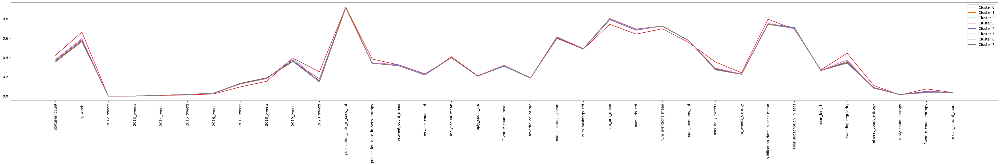

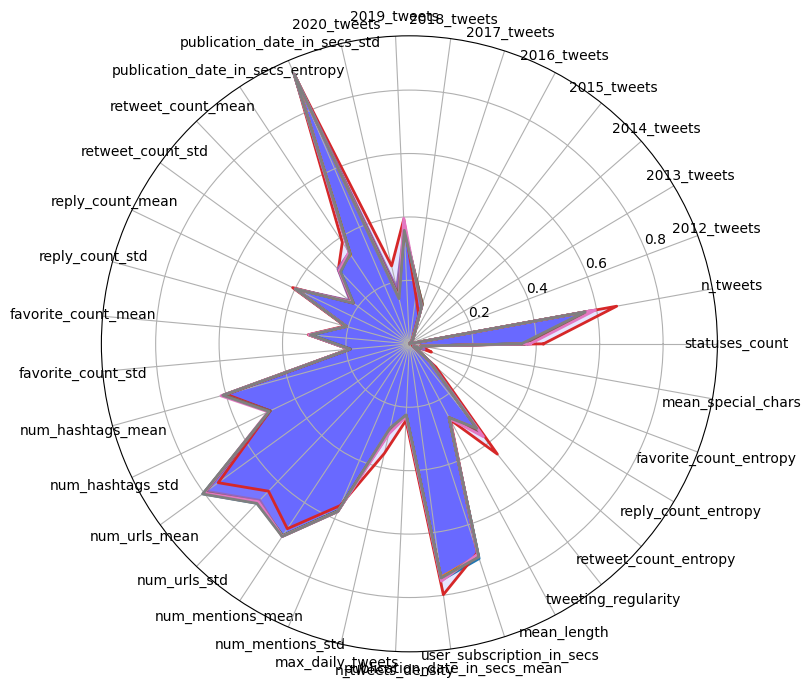

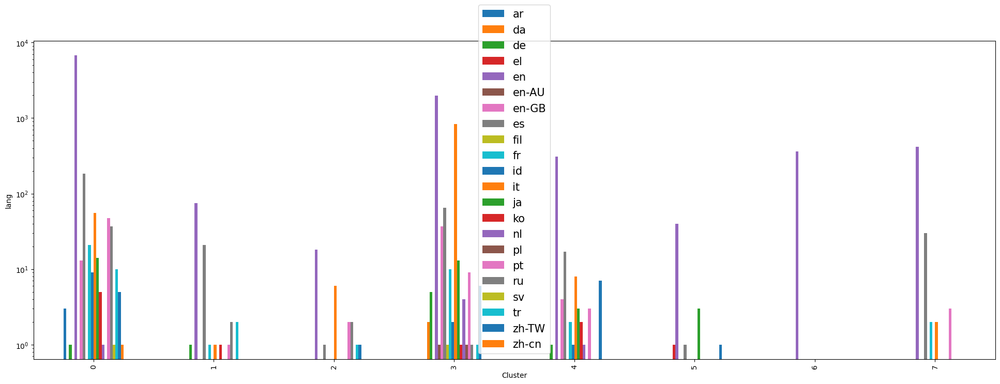

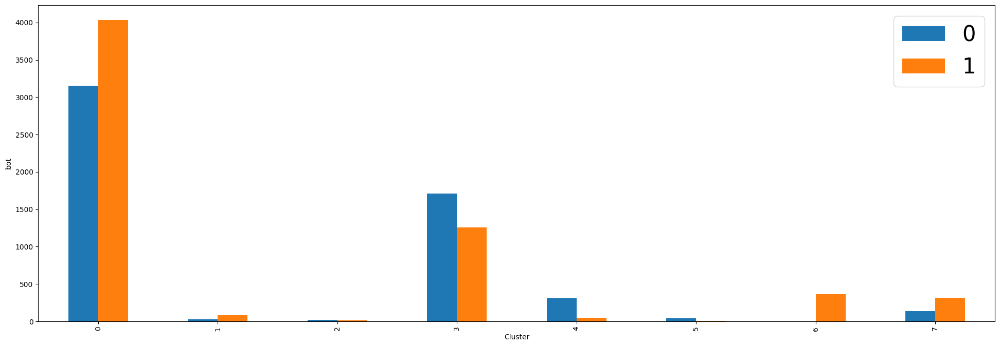

In [22]:
# Read dataset from text file
sample = df_merge_scaled[numeric_attributes].values
# Amount of cluster that should be allocated
amount = 10;
# Prepare initial means and covariances using K-Means initializer
initializer = ema_init_type.KMEANS_INITIALIZATION;
initial_means, initial_covariance = ema_initializer(sample, amount).initialize(initializer);
# Lets create observer to see clustering process
observer = ema_observer();
# Create instance of the EM algorithm
ema_instance = ema(sample, amount, initial_means, initial_covariance, observer=observer, tolerance=1e-1);
# Run clustering process
ema_instance.process();
# Extract clusters
clusters = ema_instance.get_clusters()
centroids = ema_instance.get_centers();
print(f'Number of clusters found:', np.shape(centroids)[0])

cluster_labels = dict()

'''
Since for each cluster is saved the index in list of data
it is needed to convert it in such a way that
we have a list as long as the data, and in each
position it is saved the corresponding label for the
data with that index
'''
for label in range(0, np.shape(clusters)[0]):
    for i in range(0, len(clusters[label])):
        cluster_labels[clusters[label][i]] = label

# Display allocated clusters using visualizer
covariances = ema_instance.get_covariances();


cluster_labels = dict(sorted(cluster_labels.items()))

get_metrics(df_merge_scaled[numeric_attributes], list(cluster_labels.values()))
plots(df_merge_scaled, np.array(list(cluster_labels.values())), path=f'ema', centroids=np.array(centroids), attributes = numeric_attributes)